In [0]:
import cv2
import random
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from PIL import Image
import torchvision
from torchvision import transforms as T

In [2]:
model = torchvision.models.detection.maskrcnn_resnet50_fpn(pretrained=True)
model.eval()

MaskRCNN(
  (transform): GeneralizedRCNNTransform()
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d()
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d()
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d()
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d()
          (relu): ReLU(inplace=True)
          (downsample): Sequential(
            (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
            (1): FrozenBatchNorm2d()
          )
    

In [0]:
COCO_INSTANCE_CATEGORY_NAMES = [
    '__background__', 'person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus',
    'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'N/A', 'stop sign',
    'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow',
    'elephant', 'bear', 'zebra', 'giraffe', 'N/A', 'backpack', 'umbrella', 'N/A', 'N/A',
    'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball',
    'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 'tennis racket',
    'bottle', 'N/A', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl',
    'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza',
    'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed', 'N/A', 'dining table',
    'N/A', 'N/A', 'toilet', 'N/A', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone',
    'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'N/A', 'book',
    'clock', 'vase', 'scissors', 'teddy bear', 'hair drier', 'toothbrush'
]

In [0]:
def get_prediction(img_path, threshold):
    img = Image.open(img_path)
    transform = T.Compose([T.ToTensor()])
    img = transform(img)
    pred = model([img])
    pred_score = list(pred[0]['scores'].detach().numpy())
    pred_t = [pred_score.index(x) for x in pred_score if x > threshold][-1]
    masks = (pred[0]['masks'] > 0.5).squeeze().detach().cpu().numpy()
    pred_class = [COCO_INSTANCE_CATEGORY_NAMES[i] for i in list(pred[0]['labels'].numpy())]
    pred_boxes = [[(i[0], i[1]), (i[2], i[3])] for i in list(pred[0]['boxes'].detach().numpy())]
    masks = masks[: pred_t+1]
    pred_boxes = pred_boxes[: pred_t+1]
    pred_class = pred_class[: pred_t+1]
    return masks, pred_boxes, pred_class, pred_score

In [0]:
def random_colour_masks(image):
    colours = [[10, 255, 20],  [10, 50, 255],  [255, 20, 70],
               [40, 255, 255], [255, 255, 30], [255, 50, 255],
               [80, 70, 180],  [250, 80, 190], [245, 145, 50],
               [70, 150, 250], [50, 190, 190]]
    r = np.zeros_like(image).astype(np.uint8)
    g = np.zeros_like(image).astype(np.uint8)
    b = np.zeros_like(image).astype(np.uint8)
    color = colours[random.randrange(0, 10)]
    r[image == 1], g[image == 1], b[image == 1] = color
    coloured_mask = np.stack([r, g, b], axis=2)
    return coloured_mask, color

In [0]:
def instance_segmentation_api(img_path, threshold=0.5, rect_th=3, text_size=3, text_th=3):
    masks, boxes, pred_cls, pred_score = get_prediction(img_path, threshold)
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    for i in range(len(masks)):
        rgb_mask, color = random_colour_masks(masks[i])
        img = cv2.addWeighted(img, 1, rgb_mask, 0.5, 0)
        cv2.rectangle(img, boxes[i][0], boxes[i][1], color, rect_th, rect_th)
        cv2.putText(img, f'{pred_cls[i]} {pred_score[i]:.2f}', boxes[i][0], cv2.FONT_HERSHEY_SIMPLEX, 
                    text_size, (220, 220, 220), thickness=text_th)
    plt.figure(figsize=(18, 18))
    plt.imshow(img)
    plt.xticks([])
    plt.yticks([])
    plt.show()

In [7]:
!wget https://hips.hearstapps.com/hmg-prod.s3.amazonaws.com/images/10best-cars-group-cropped-1542126037.jpg -O car.jpg
!wget https://cdn.pixabay.com/photo/2013/07/05/01/08/traffic-143391_960_720.jpg -O traffic.jpg
!wget https://images.unsplash.com/photo-1458169495136-854e4c39548a -O girl_cars.jpg
!wget https://images.unsplash.com/photo-1518882174711-1de40238921b -O dogs.jpg
!wget https://images.unsplash.com/photo-1583784561126-c18e59057f3b -O fashion.jpg
!wget https://images.unsplash.com/photo-1572947247229-774cc3a30caa -O 4_girls.jpg

--2020-03-15 15:39:08--  https://hips.hearstapps.com/hmg-prod.s3.amazonaws.com/images/10best-cars-group-cropped-1542126037.jpg
Resolving hips.hearstapps.com (hips.hearstapps.com)... 151.101.0.155, 151.101.64.155, 151.101.128.155, ...
Connecting to hips.hearstapps.com (hips.hearstapps.com)|151.101.0.155|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2305852 (2.2M) [image/jpeg]
Saving to: ‘car.jpg’

car.jpg             100%[===================>]   2.20M  12.1MB/s    in 0.2s    

2020-03-15 15:39:09 (12.1 MB/s) - ‘car.jpg’ saved [2305852/2305852]

--2020-03-15 15:39:11--  https://cdn.pixabay.com/photo/2013/07/05/01/08/traffic-143391_960_720.jpg
Resolving cdn.pixabay.com (cdn.pixabay.com)... 104.18.20.183, 104.18.21.183, 2606:4700::6812:15b7, ...
Connecting to cdn.pixabay.com (cdn.pixabay.com)|104.18.20.183|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 192644 (188K) [image/jpeg]
Saving to: ‘traffic.jpg’

traffic.jpg         100%[======

In [8]:
!wget https://images.unsplash.com/photo-1558907685-9f38cd850e1e -O elephant.jpg
!wget https://images.unsplash.com/photo-1562551156-fc4d4f96cee5 -O flamingo.jpg
!wget https://images.unsplash.com/photo-1528642474498-1af0c17fd8c3 -O peoples_on_street.jpg
!wget https://images.unsplash.com/photo-1488134684157-fea2d81a5ec4 -O cars.jpg

--2020-03-15 15:39:19--  https://images.unsplash.com/photo-1558907685-9f38cd850e1e
Resolving images.unsplash.com (images.unsplash.com)... 151.101.186.208, 2a04:4e42:2c::720
Connecting to images.unsplash.com (images.unsplash.com)|151.101.186.208|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 8935198 (8.5M) [image/jpeg]
Saving to: ‘elephant.jpg’

elephant.jpg        100%[===================>]   8.52M  21.8MB/s    in 0.4s    

2020-03-15 15:39:19 (21.8 MB/s) - ‘elephant.jpg’ saved [8935198/8935198]

--2020-03-15 15:39:21--  https://images.unsplash.com/photo-1562551156-fc4d4f96cee5
Resolving images.unsplash.com (images.unsplash.com)... 151.101.186.208, 2a04:4e42:2c::720
Connecting to images.unsplash.com (images.unsplash.com)|151.101.186.208|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1282441 (1.2M) [image/jpeg]
Saving to: ‘flamingo.jpg’

flamingo.jpg        100%[===================>]   1.22M  --.-KB/s    in 0.1s    

2020-03-15 15:39

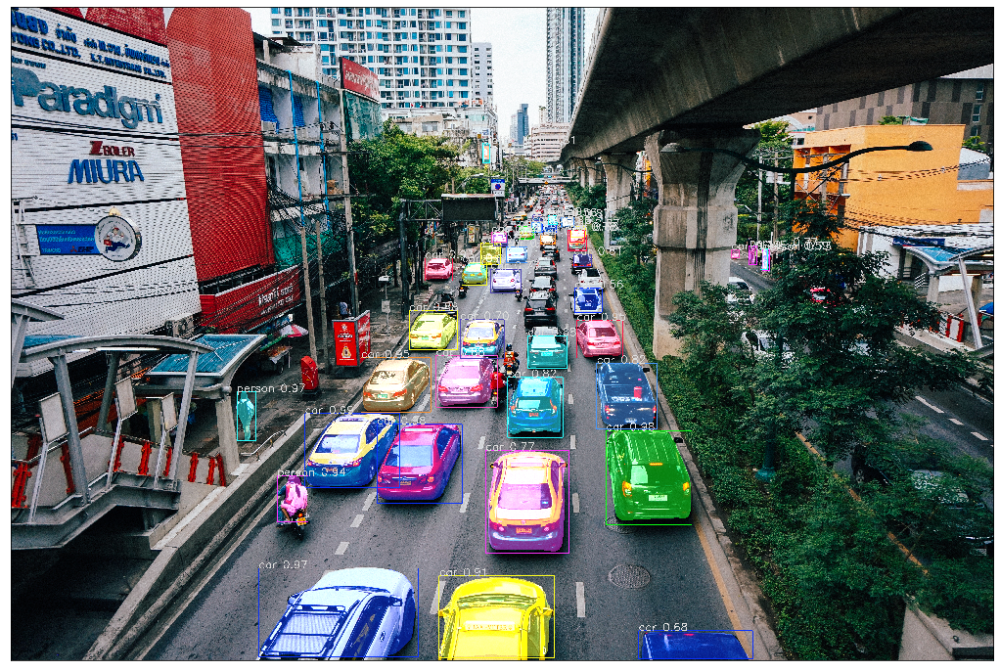

In [9]:
instance_segmentation_api('./cars.jpg', threshold=0.5, text_size=2)

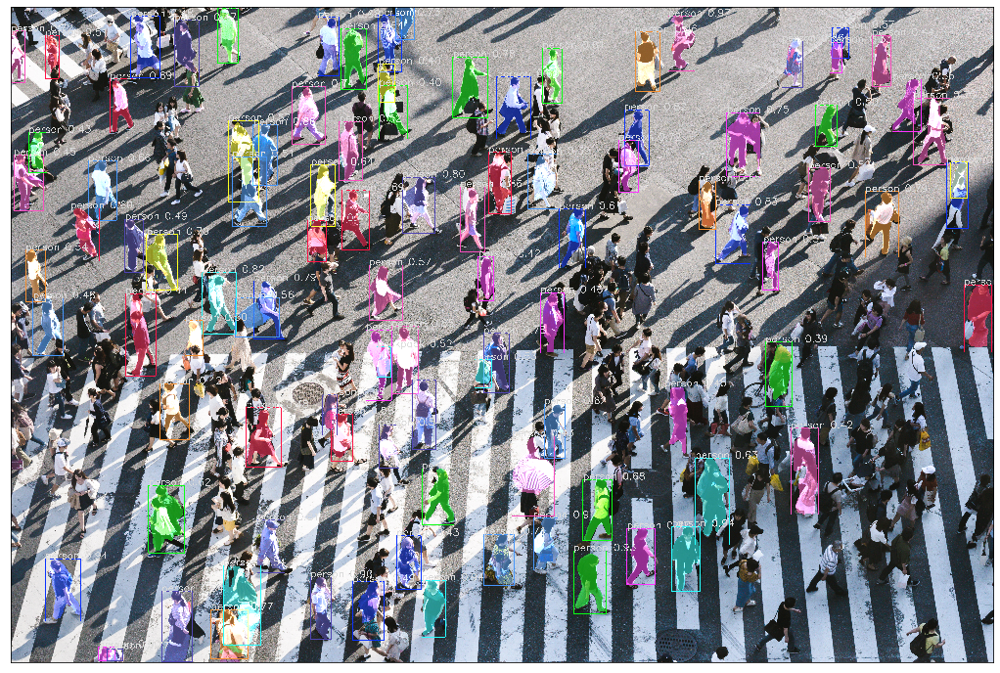

In [10]:
instance_segmentation_api('./peoples_on_street.jpg', threshold=0.15, text_size=2)

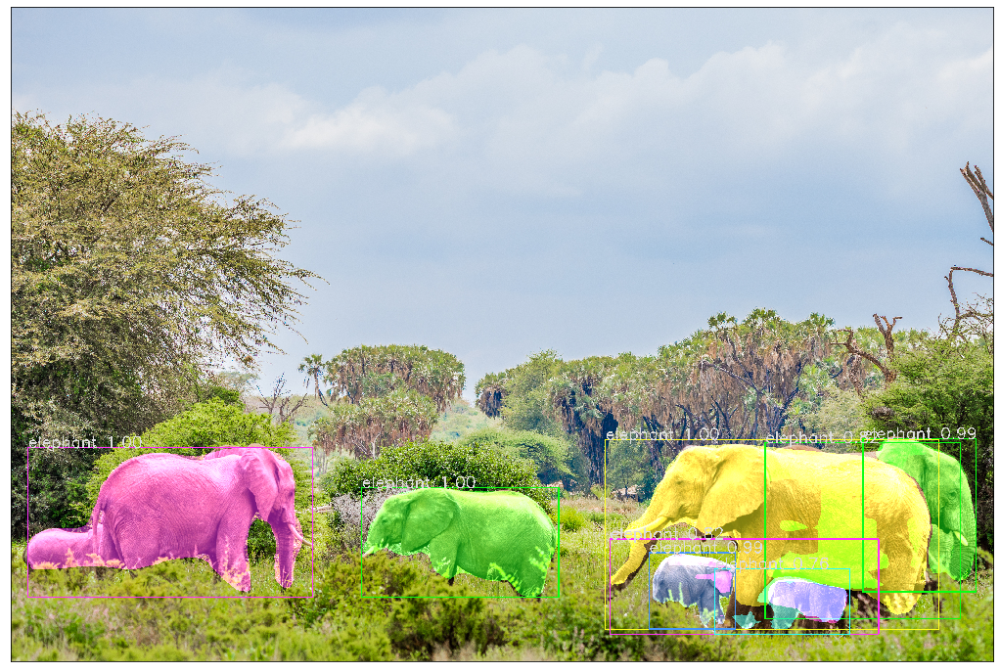

In [11]:
instance_segmentation_api('./elephant.jpg', text_size=2)

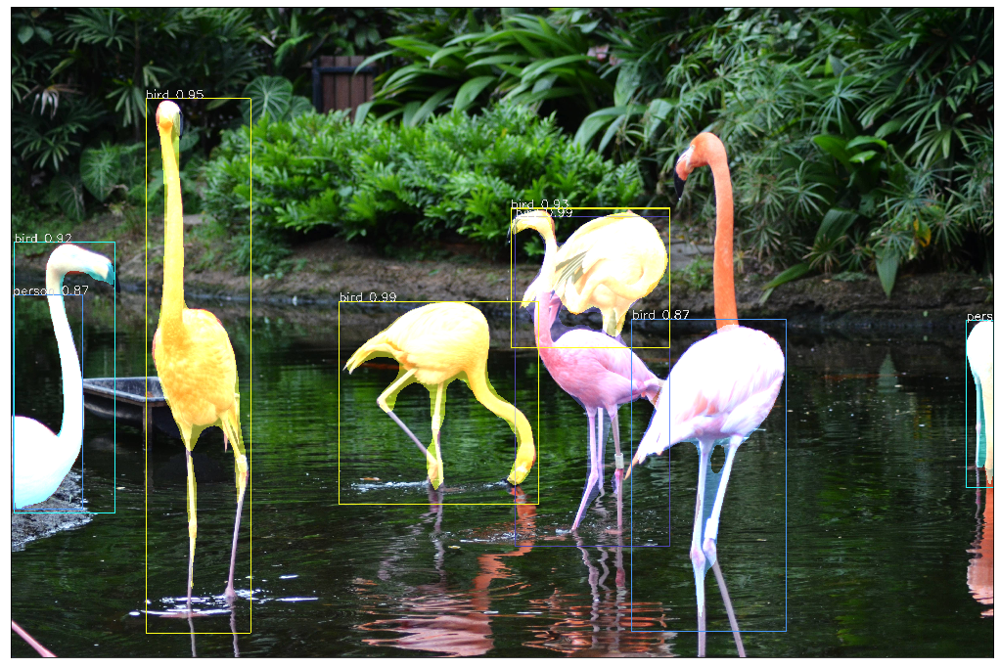

In [12]:
instance_segmentation_api('./flamingo.jpg', text_size=2)

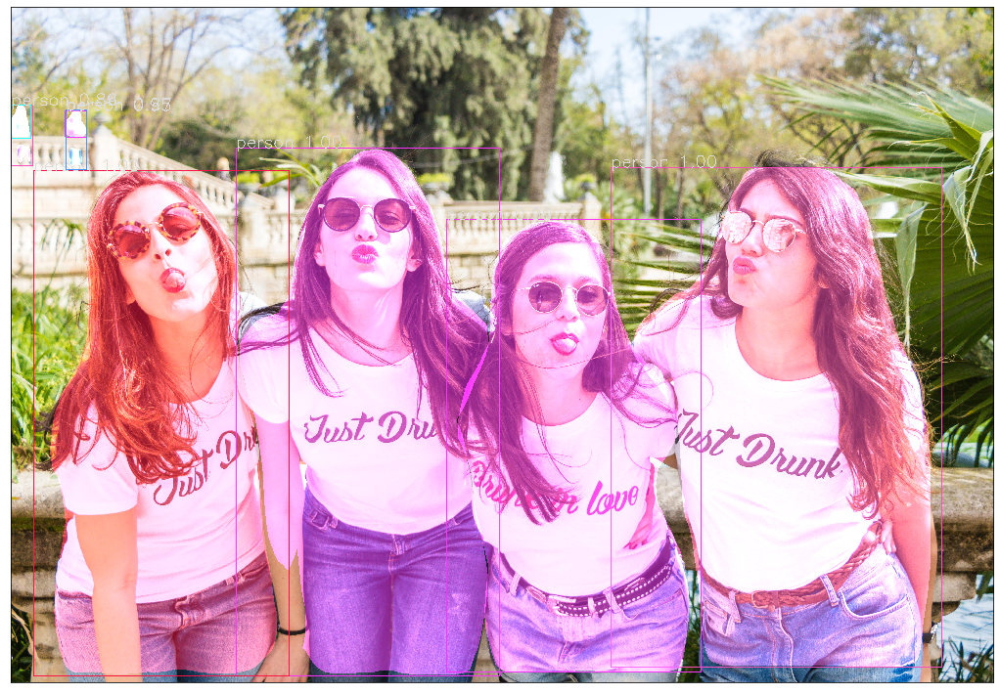

In [13]:
instance_segmentation_api('./4_girls.jpg')

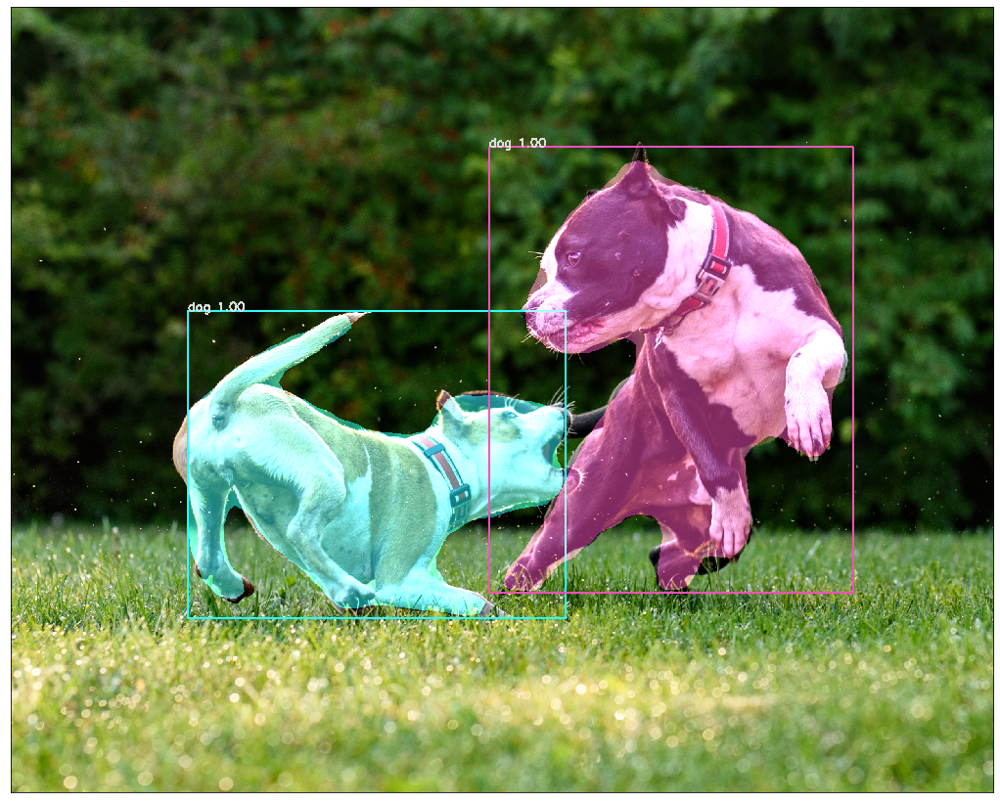

In [14]:
instance_segmentation_api('./dogs.jpg', text_size=1)

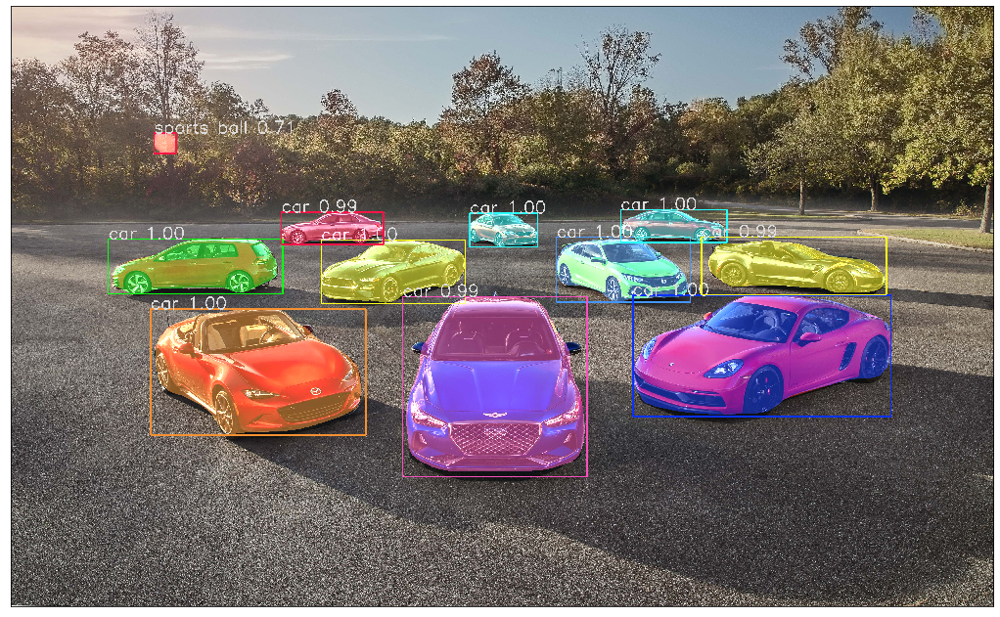

In [15]:
instance_segmentation_api('./car.jpg', text_size=2)

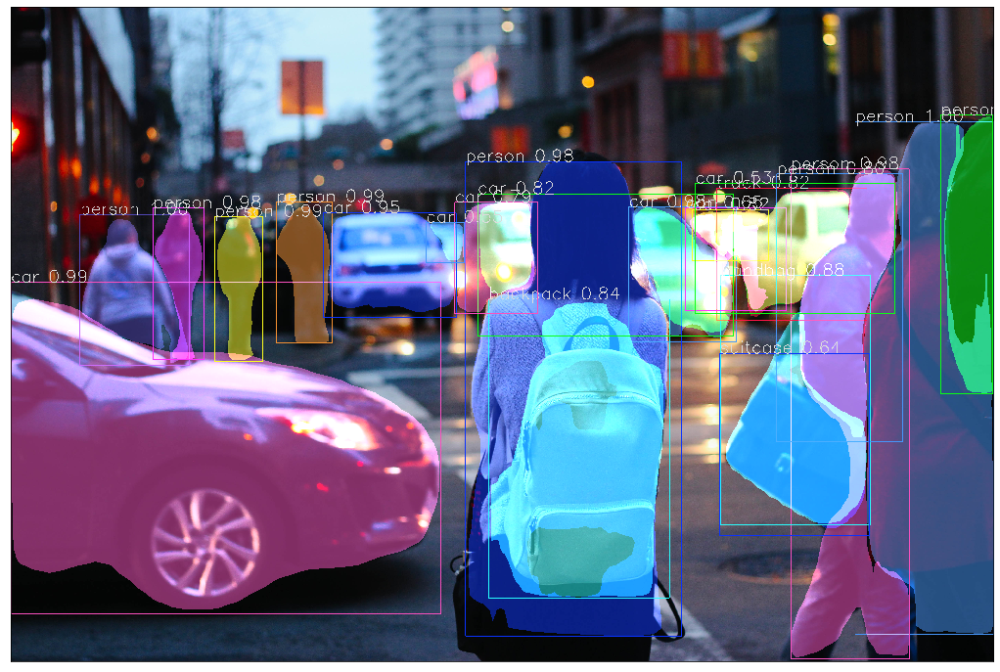

In [16]:
instance_segmentation_api('./girl_cars.jpg')

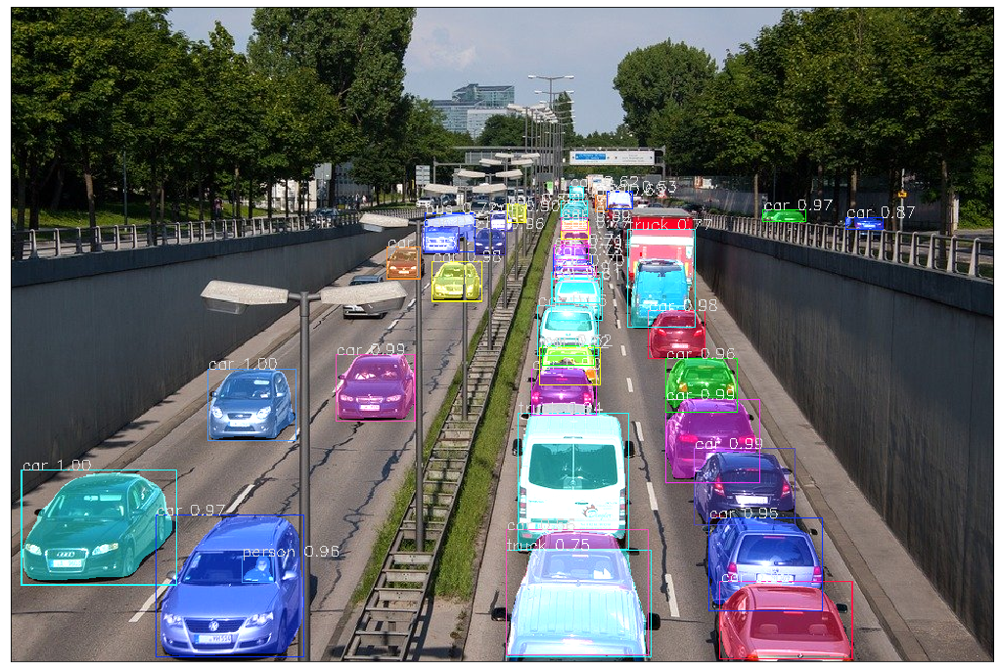

In [17]:
instance_segmentation_api('./traffic.jpg', rect_th=1, text_size=0.5, text_th=1)